# Automatic Toll Booth: 

To detect vehicles and maintain a counter for each individual type of vehicle that is both entering and leaving the toll area using YOLO v8. This can be used to automate toll boths, Analyse traffic patterns to design/improve roads, help estimate pollutions levels with respect to time and day, and help assist traffic cameras with speed estimation. 

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/highway-sample/Sample_highway.mp4


In [2]:
!pip install ultralytics -q

In [3]:
import cv2
from ultralytics import YOLO
import matplotlib.pyplot as plt
import seaborn as sns
import subprocess
from tqdm.notebook import tqdm
import IPython
from IPython.display import Video, display
%matplotlib inline

In [4]:
path = "/kaggle/input/highway-sample/Sample_highway.mp4"

In [5]:
frac = 0.65 
#display(Video(data=path, height=int(720*frac), width=int(1280*frac)))
display(Video(data=path, embed=True, height=int(720*frac), width=int(1280*frac)))

In [6]:

#load YOLO
model = YOLO('yolov8x.pt')

#geting names from classes
dict_classes = model.model.names

  0%|          | 0.00/131M [00:00<?, ?B/s]

In [7]:
dict_classes

{0: 'person',
 1: 'bicycle',
 2: 'car',
 3: 'motorcycle',
 4: 'airplane',
 5: 'bus',
 6: 'train',
 7: 'truck',
 8: 'boat',
 9: 'traffic light',
 10: 'fire hydrant',
 11: 'stop sign',
 12: 'parking meter',
 13: 'bench',
 14: 'bird',
 15: 'cat',
 16: 'dog',
 17: 'horse',
 18: 'sheep',
 19: 'cow',
 20: 'elephant',
 21: 'bear',
 22: 'zebra',
 23: 'giraffe',
 24: 'backpack',
 25: 'umbrella',
 26: 'handbag',
 27: 'tie',
 28: 'suitcase',
 29: 'frisbee',
 30: 'skis',
 31: 'snowboard',
 32: 'sports ball',
 33: 'kite',
 34: 'baseball bat',
 35: 'baseball glove',
 36: 'skateboard',
 37: 'surfboard',
 38: 'tennis racket',
 39: 'bottle',
 40: 'wine glass',
 41: 'cup',
 42: 'fork',
 43: 'knife',
 44: 'spoon',
 45: 'bowl',
 46: 'banana',
 47: 'apple',
 48: 'sandwich',
 49: 'orange',
 50: 'broccoli',
 51: 'carrot',
 52: 'hot dog',
 53: 'pizza',
 54: 'donut',
 55: 'cake',
 56: 'chair',
 57: 'couch',
 58: 'potted plant',
 59: 'bed',
 60: 'dining table',
 61: 'toilet',
 62: 'tv',
 63: 'laptop',
 64: 'mou

In [8]:
# resizing helper function
def to_resize(frame, scaling_factor):
    width = int(frame.shape[1] * scaling_factor / 100)
    height = int(frame.shape[0] * scaling_factor / 100)
    dim = (width, height)
    resized = cv2.resize(frame, dim, interpolation = cv2.INTER_AREA)
    return resized

In [9]:
import warnings
warnings.filterwarnings('ignore')

# Default Settings
verbose = False
scaling_factor = 90

#Capture video frames
video = cv2.VideoCapture(path)

# Class IDs of interest [car, motorcycle, bus, truck]
class_ids = [2, 3, 5, 7] 

# Helper variables
centers_old = {}
centers_new = {}
end = []
frames_list = []
obj_id = 0 
total_in = 0
total_out = 0
count_veh_in = dict.fromkeys(class_ids, 0)
count_veh_out = dict.fromkeys(class_ids, 0)
transline_center_y = int(500 * scaling_factor/100 ) #450
transline_center_x = int(670 * scaling_factor/100) #603
offset = int(8 * scaling_factor/100 )

print('>>>> Verbose during Prediction:', verbose)


# Original and scaled video info
height = int(video.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(video.get(cv2.CAP_PROP_FRAME_WIDTH))
fps = video.get(cv2.CAP_PROP_FPS)
print('>>>> Original Dim: ', (width, height))
if scaling_factor != 100:
    width = int(width * scaling_factor / 100)
    height = int(height * scaling_factor / 100)
    print('>>>> Dim Scaled: ', (width, height))
    

# Output video setup
video_name = 'result.mp4'
output_path = "predicted_" + video_name
tmp_output_path = "tmp_" + output_path
VIDEO_CODEC = "MP4V"

output_video = cv2.VideoWriter(tmp_output_path, 
                               cv2.VideoWriter_fourcc(*VIDEO_CODEC), 
                               fps, (width, height))


# Reading and generate predictions for each frame
for i in tqdm(range(int(video.get(cv2.CAP_PROP_FRAME_COUNT)))):
    
    # Read frame
    _, frame = video.read()
    
    #Resize frame
    frame  = to_resize(frame, scaling_factor)
    
    if verbose:
        print('Dimension Scaled(frame): ', (frame.shape[1], frame.shape[0]))

    # Load predictions
    preds = model.predict(frame, conf = 0.7, classes = class_ids, device = 0, verbose = False)
    
    # Load bounding boxes, confidence and classes of each object found per frame
    boxes   = preds[0].boxes.xyxy.cpu().numpy()
    conf    = preds[0].boxes.conf.cpu().numpy()
    classes = preds[0].boxes.cls.cpu().numpy() 
    
    # Load object info in a dataframe
    objects_per_frame = pd.DataFrame(preds[0].cpu().numpy().boxes.boxes, columns = ['xmin', 'ymin', 'xmax', 'ymax', 'conf', 'class'])
    
    #IDs to Labels
    labels = [dict_classes[i] for i in classes]
    
    # Print transition line for count
    #cv2.line(frame, (0, transline_center_y), (int(4500 * scaling_factor/100 ), transline_center_y), (255,255,0),8)
    cv2.line(frame, (0, transline_center_y), (int(1500 * scaling_factor/100 ), transline_center_y), (0, 255, 255),8)
    
    # BBs for each obj passing and increment total in and out counter variables
    for ix, row in enumerate(objects_per_frame.iterrows()):
        # Getting the coordinates of each vehicle
        xmin, ymin, xmax, ymax, confidence, category,  = row[1].astype('int')
        
        # Calculating the center of the bounding-box
        center_x, center_y = int(((xmax+xmin))/2), int((ymax+ ymin)/2)
        
        # Print center and bounding-box of vehicle in the given frame 
        cv2.rectangle(frame, (xmin, ymin), (xmax, ymax), (0,0,255), 5) # boundingBox
        cv2.circle(frame, (center_x,center_y), 5,(0,0,255),-1) # center of boundingBox
        
        #Print label of the Object over BBs
        cv2.putText(img=frame, text=labels[ix]+' - '+str(np.round(conf[ix],2)),
                    org= (xmin,ymin-10), fontFace=cv2.FONT_HERSHEY_PLAIN, fontScale=1, color=(0,0,255),thickness=2)
        
        # Checking for the center of obj in and around transline; offset for better performance.
        if (center_y < (transline_center_y + offset)) and (center_y > (transline_center_y - offset)):
            if  (center_x >= 0) and (center_x <=transline_center_x):
                total_in +=1
                count_veh_in[category] += 1
            else:
                total_out += 1
                count_veh_out[category] += 1
    
    #counter for the types of vehicles predicted
    total_in_plt = [f'{dict_classes[k]}: {i}' for k, i in count_veh_in.items()]
    total_out_plt = [f'{dict_classes[k]}: {i}' for k, i in count_veh_out.items()]
    
    #draw BG for legibility
    #cv2.rectangle(img=frame,pt1= (25,25),pt2= (130,130), color=(255,255,255),thickness= -1)
    #cv2.rectangle(img=frame, pt1=(25, int(800 * scaling_factor/100 )), pt2=(130,710),color= (255,255,255),thickness= -1)
    
    #Labels of objects incoming and outgoing traffic
    cv2.putText(img=frame, text='In Flow', 
                org= (30,30), fontFace=cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=1, color=(0, 0, 0),thickness=1)
    
    cv2.putText(img=frame, text='Out Flow', 
                org= (int(800 * scaling_factor/100 ),30), 
                fontFace=cv2.FONT_HERSHEY_SIMPLEX, fontScale=1, color=(0, 0, 0),thickness=1)
    
    #print the respective count for each type of vehicle
    xt = 40
    for txt in range(len(total_in_plt)):
        xt +=20
        cv2.putText(img=frame, text=total_in_plt[txt], 
                    org= (30,xt), fontFace=cv2.FONT_HERSHEY_PLAIN, 
                    fontScale=1, color=(0, 0, 0),thickness=1)
        
        cv2.putText(img=frame, text=total_out_plt[txt],
                    org= (int(800 * scaling_factor/100 ),xt), fontFace=cv2.FONT_HERSHEY_PLAIN,
                    fontScale=1, color=(0, 0, 0),thickness=1)
    
    #print the total number of vehicles in and out
    cv2.putText(img=frame, text=f'In:{total_in}', 
                org= (int(645 * scaling_factor/100 ),transline_center_y+60),
                fontFace=cv2.FONT_HERSHEY_PLAIN, fontScale=1, color=(0, 0, 255),thickness=2)
    
    cv2.putText(img=frame, text=f'Out:{total_out}', 
                org= (int(625 * scaling_factor/100 ),transline_center_y-40),
                fontFace=cv2.FONT_HERSHEY_PLAIN, fontScale=1, color=(0, 0, 255),thickness=2)

    if verbose:
        print(total_in, total_out)
    #Saving frames to a list 
    frames_list.append(frame)
    #writing the modified frames to a video for output
    output_video.write(frame)
    
#Release video object
output_video.release()


# Kaggle specific post processing for embedding
if os.path.exists(output_path):
    os.remove(output_path)
    
subprocess.run(
    ["ffmpeg",  "-i", tmp_output_path,"-crf","18","-preset","veryfast","-hide_banner","-loglevel","error","-vcodec","libx264",output_path])
os.remove(tmp_output_path)

>>>> Verbose during Prediction: False
>>>> Original Dim:  (1280, 720)
>>>> Dim Scaled:  (1152, 648)


OpenCV: FFMPEG: tag 0x5634504d/'MP4V' is not supported with codec id 12 and format 'mp4 / MP4 (MPEG-4 Part 14)'
OpenCV: FFMPEG: fallback to use tag 0x7634706d/'mp4v'


  0%|          | 0/307 [00:00<?, ?it/s]

WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️ 'Boxes.boxes' is deprecated. Use 'Boxes.data' instead.
WARNING ⚠️

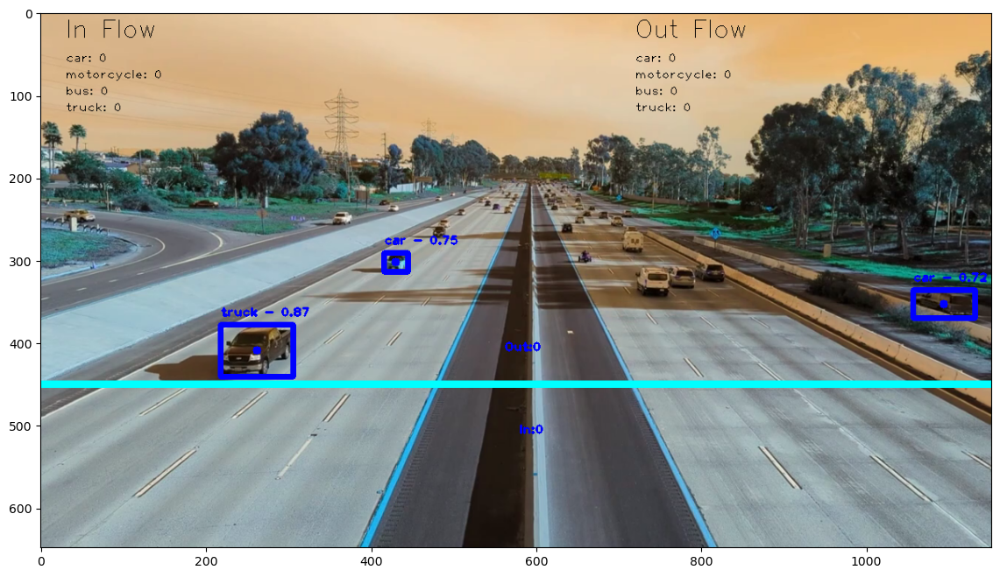

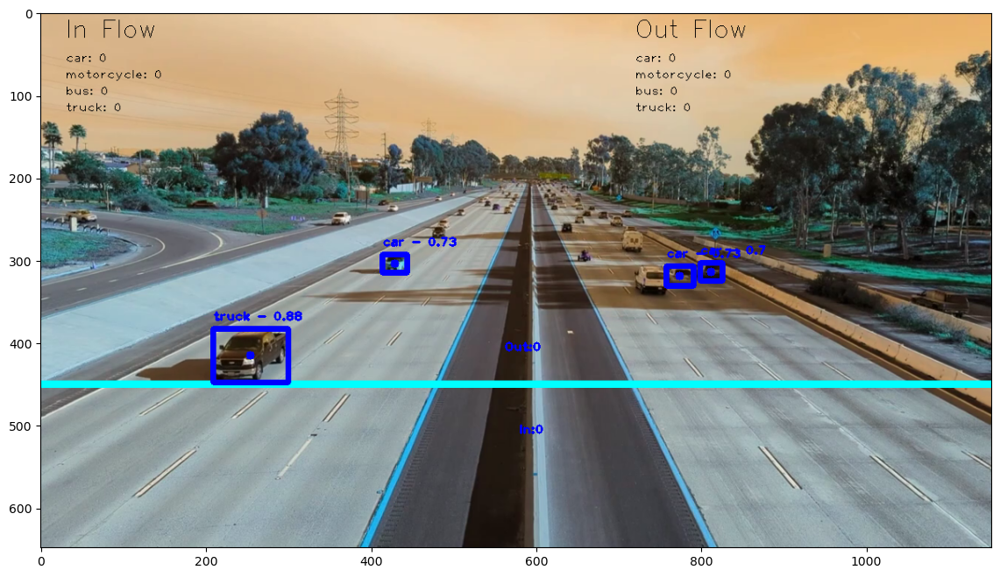

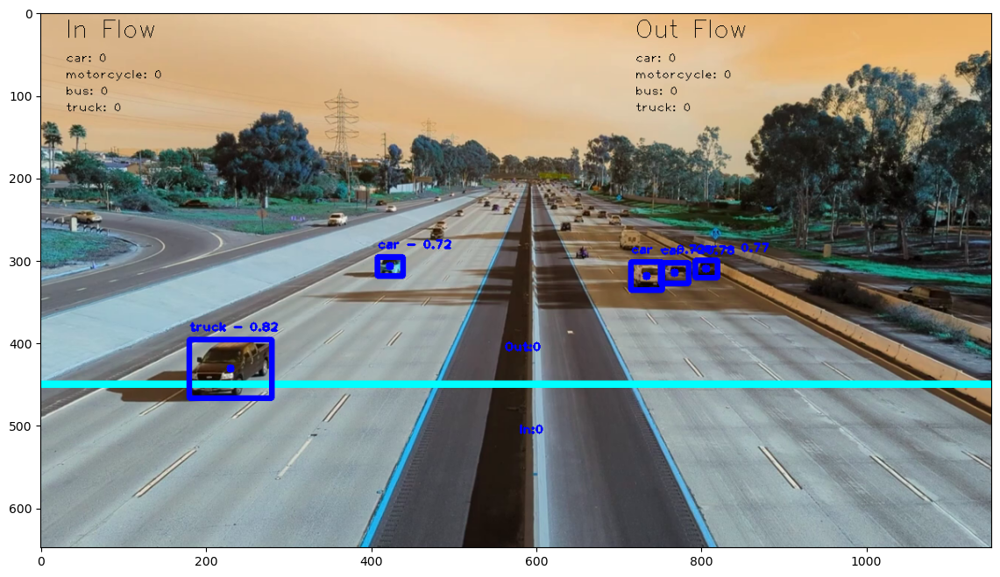

In [10]:
#Sapmling a few frames for testing

#[28, 29, 32, 40, 42, 50, 58]
#[22, 23, 34, 46, 47, 59, 60]

for i in [28, 29, 32]:
    plt.figure(figsize =( 14, 10))
    plt.imshow(frames_list[i])
    plt.show()

In [11]:
#output video result
frac = 0.8
Video(data='predicted_result.mp4', embed=True, height=int(720 * frac), width=int(1280 * frac))

## Future Improvements:

* Add total toll charges earned on each side of the road.
* Add speed estimation
* Add polution estimation
* add most popular type of vehicle on each side of the road. 